<a href="https://colab.research.google.com/github/ngoan22mse23088/GraduationThesis/blob/master/Making_the_Most_of_your_Colab_Subscription.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'face-detection-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3345370%2F5891144%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240908%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240908T045129Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D86b353b0ba09a550fc1d287544ea684e3b059dd40c10de0365a1add619df3b710672e4406cc55ae538bad018bd637900aa77174f8279acebcef34fbf57d4fec2c570d4ee90f88af55d77bce324ba405d2522864663f5b26afa0cacd7e8a1b880eb1b5f6640794065c7cc080e59aa0d9585d35d3daa158524ec88cf661ce37b3d7f9d8e8465089420d5b91626149d272b5c387db5a1249f779304df64860151ef42725b1bbebc1b7cc77c07af63d9bc2ce2142dde5cec8ba200e99f2eff12fe8c37b12b564923e69f19b49adcced93e42684cb712e08860f27dbcca3511ece1a60cc83869b175a751408ac8773c35c9815c95432917f41e88e2ebe2d97d27f102'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

[==================================================] 4761404070 bytes downloaded
Downloaded and uncompressed: face-detection-dataset
Data source import complete.


In [ ]:
!pip install ultralytics
!pip install -U ray

In [4]:
import warnings
warnings.filterwarnings('ignore')

import os
import shutil
import matplotlib.pyplot as plt
import numpy as pd
from tqdm.auto import tqdm
import yaml
import ultralytics
from ultralytics import YOLO
import torch

train_source_images_dir = '/kaggle/input/face-detection-dataset/images/train'
train_source_labels_dir = '/kaggle/input/face-detection-dataset/labels/train'
train_destination_dir = '/kaggle/working/train'

val_source_images_dir = '/kaggle/input/face-detection-dataset/images/val'
val_source_labels_dir = '/kaggle/input/face-detection-dataset/labels/val'
val_destination_dir = '/kaggle/working/val'

In [5]:
os.makedirs(train_destination_dir, exist_ok=True)
os.makedirs(val_destination_dir, exist_ok=True)

In [6]:
# Copy train images
for filename in tqdm(os.listdir(train_source_images_dir)):
    train_src_path = os.path.join(train_source_images_dir, filename)
    train_dst_path = os.path.join(train_destination_dir, filename)
    shutil.copy(train_src_path, train_dst_path)

  0%|          | 0/13386 [00:00<?, ?it/s]

In [7]:
# Copy val images
for filename in tqdm(os.listdir(val_source_images_dir)):
    val_src_path = os.path.join(val_source_images_dir, filename)
    val_dst_path = os.path.join(val_destination_dir, filename)
    shutil.copy(val_src_path, val_dst_path)

  0%|          | 0/3347 [00:00<?, ?it/s]

In [8]:
# Copy train labels
for filename in tqdm(os.listdir(train_source_labels_dir)):
    train_src_path = os.path.join(train_source_labels_dir, filename)
    train_dst_path = os.path.join(train_destination_dir, filename)
    shutil.copy(train_src_path, train_dst_path)

  0%|          | 0/13386 [00:00<?, ?it/s]

In [9]:
# Copy val labels
for filename in tqdm(os.listdir(val_source_labels_dir)):
    val_src_path = os.path.join(val_source_labels_dir, filename)
    val_dst_path = os.path.join(val_destination_dir, filename)
    shutil.copy(val_src_path, val_dst_path)

  0%|          | 0/3347 [00:00<?, ?it/s]

In [10]:
l=os.listdir(val_destination_dir)
l = sorted(l)
# print(l)
counter= 0
for i in tqdm(range(0,len(l),2)):
    if(l[i][0:-4]==l[i+1][0:-4]):
        counter +=1
    else :
        print('false')
print(counter)

  0%|          | 0/3347 [00:00<?, ?it/s]

3347


In [11]:
l=os.listdir(train_destination_dir)
l = sorted(l)
# print(l)
counter= 0
for i in tqdm(range(0,len(l),2)):
    if(l[i][0:-4]==l[i+1][0:-4]):
        counter +=1
    else :
        print('false')
print(counter)

  0%|          | 0/13386 [00:00<?, ?it/s]

13386


In [12]:
dataset_config = {
    'nc': 1,
    'names': ['face'],
    'train': '/kaggle/working/train',
    'val': '/kaggle/working/val',
    'device': 0
}

In [13]:
with open('dataset.yaml', 'w') as file:
    yaml.dump(dataset_config, file, default_flow_style=False)

In [14]:
print(ultralytics.checks())

Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 42.2/235.7 GB disk)
None


In [29]:
model = YOLO('yolov8n.pt')
# Enable Automatic Mixed Precision
if torch.cuda.is_available():
    model.half()  # Converts model to half precision

torch.cuda.is_available()
max_batch_size = 64
model.to(device=0)
results = model.train(data='./dataset.yaml', batch=max_batch_size, epochs=100, imgsz=640)

engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=./dataset.yaml, epochs=100, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynam

train: Scanning /kaggle/working/train.cache... 13386 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13386/13386 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/val.cache... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      11.5G      1.439      1.761      1.303         27        640: 100%|██████████| 210/210 [02:01<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.50it/s]


                   all       3347      10299      0.822        0.7      0.765      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      14.7G      1.288     0.9828      1.109         42        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.55it/s]


                   all       3347      10299      0.836      0.641      0.717       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100        13G      1.314     0.9255      1.129         35        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]


                   all       3347      10299      0.839      0.626      0.717      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      13.9G      1.335     0.9124      1.148         88        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.56it/s]


                   all       3347      10299      0.841      0.648      0.726      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      12.9G      1.297     0.8449      1.133         62        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]


                   all       3347      10299      0.884      0.699       0.79      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      13.8G      1.277     0.8043      1.121         44        640: 100%|██████████| 210/210 [01:59<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.59it/s]


                   all       3347      10299      0.863        0.7      0.793      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      13.6G      1.262     0.7751      1.112         52        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]


                   all       3347      10299      0.878      0.738      0.819      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      12.4G       1.25     0.7649      1.108         54        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]


                   all       3347      10299      0.881      0.739      0.824      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      13.2G      1.241     0.7487      1.103         47        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]

                   all       3347      10299      0.874      0.718      0.802      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      11.2G      1.235     0.7413        1.1        108        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.60it/s]


                   all       3347      10299      0.886      0.766      0.841      0.543

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      13.3G      1.221     0.7236      1.092         44        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]


                   all       3347      10299      0.886      0.766      0.848      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.2G      1.219     0.7118      1.089         56        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.897      0.765       0.85      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      14.8G      1.213     0.7017      1.089         44        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]


                   all       3347      10299      0.895      0.772      0.852      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      12.8G      1.202     0.6937      1.081         38        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.888      0.778      0.855      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      11.6G      1.208     0.6917      1.085         56        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.894      0.772      0.852      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      11.2G      1.195      0.684      1.081         41        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]


                   all       3347      10299      0.883      0.785      0.856      0.554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      12.9G      1.189      0.672      1.076         73        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]


                   all       3347      10299      0.889      0.782      0.857      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      14.5G       1.19     0.6718      1.075         69        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.889      0.779      0.854      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      12.8G      1.184     0.6698      1.077         44        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.893      0.783      0.863      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100        12G      1.182     0.6641      1.075         48        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.878      0.798      0.863      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      9.96G      1.178     0.6603      1.073         49        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]


                   all       3347      10299      0.893      0.793      0.867      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.3G      1.177      0.656      1.067         86        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.887      0.799      0.866       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      12.7G      1.174     0.6501      1.067         54        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.895      0.794       0.87       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.7G      1.168     0.6451      1.065         42        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]

                   all       3347      10299      0.894      0.792      0.872      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100        11G      1.172     0.6443      1.067         34        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]


                   all       3347      10299      0.898        0.8      0.875      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.9G      1.154     0.6322      1.062         63        640: 100%|██████████| 210/210 [01:58<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.60it/s]


                   all       3347      10299      0.891      0.799      0.871      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.9G      1.172     0.6389      1.063         39        640: 100%|██████████| 210/210 [01:59<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.56it/s]


                   all       3347      10299      0.888      0.803      0.874      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.1G      1.157     0.6263      1.058         56        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]


                   all       3347      10299      0.891      0.806      0.873      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      11.9G      1.162     0.6282      1.059         34        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.895      0.804      0.877      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      12.8G      1.157     0.6262      1.061         67        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.59it/s]


                   all       3347      10299      0.895      0.802      0.876       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      13.4G      1.156     0.6266      1.058         40        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]


                   all       3347      10299      0.899      0.801      0.877       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      13.1G      1.153     0.6173       1.06         33        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.896      0.801      0.876      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      12.4G      1.151     0.6218      1.054         69        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]


                   all       3347      10299      0.899      0.799      0.876      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      11.4G      1.144     0.6127      1.052         49        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299        0.9      0.802      0.877      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      13.3G      1.146     0.6117      1.055         42        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]


                   all       3347      10299      0.893      0.809      0.877      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      12.7G      1.144     0.6119       1.05         58        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.894       0.81      0.882      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100        12G      1.143     0.6079      1.056         35        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]


                   all       3347      10299        0.9      0.807      0.881      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100        11G      1.147     0.6107      1.052         23        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.60it/s]

                   all       3347      10299      0.899      0.806      0.881      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      12.8G      1.147     0.6112      1.054         42        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.66it/s]

                   all       3347      10299      0.894      0.815      0.883      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      11.5G      1.134     0.6015       1.05         68        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.891      0.817      0.883       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.7G      1.133     0.5957      1.047         60        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.897       0.81      0.883      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      11.9G      1.138     0.6003       1.05         40        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.898      0.813      0.883       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      11.2G      1.134     0.5983      1.046         32        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.895      0.814      0.885       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      13.7G      1.126     0.5939      1.045         42        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.896      0.815      0.885      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      13.2G      1.128     0.5889      1.043         80        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.892      0.821      0.886      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.9G      1.125     0.5869      1.042         51        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.897      0.815      0.886      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      13.8G      1.121     0.5865      1.043         61        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.898      0.815      0.884      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.8G      1.129     0.5899      1.044         68        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]

                   all       3347      10299      0.898      0.813      0.885      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      11.8G      1.113      0.577       1.04         41        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]

                   all       3347      10299      0.894      0.817      0.887      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.8G      1.131     0.5841      1.046         64        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.60it/s]


                   all       3347      10299      0.898      0.814      0.887      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      12.9G      1.117     0.5812      1.039         47        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.896      0.813      0.887      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      11.3G      1.119     0.5743      1.041         44        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.899       0.81      0.887      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      12.4G      1.121     0.5732      1.037         66        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.66it/s]

                   all       3347      10299      0.899      0.812      0.888      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      12.2G      1.123     0.5742       1.04         29        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.66it/s]

                   all       3347      10299        0.9      0.811      0.887      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      13.4G      1.115     0.5719      1.036         57        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.896      0.812      0.886      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      12.8G      1.113       0.57      1.035         51        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.897      0.812      0.887      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100        12G      1.117     0.5664      1.035         64        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.894      0.816      0.888      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.9G      1.104     0.5593      1.032         29        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.66it/s]

                   all       3347      10299      0.893      0.819      0.888      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      11.4G      1.105     0.5599      1.036         36        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.893      0.818      0.889      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.1G      1.105     0.5575      1.033         41        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.898      0.815       0.89      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      12.5G      1.111     0.5577      1.034         35        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.903      0.811      0.889      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.4G      1.103     0.5578       1.03         44        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.897      0.816      0.889      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      12.9G      1.106     0.5532      1.033         36        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.901      0.814      0.889      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      12.5G      1.096      0.553      1.029         33        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.896      0.816      0.889      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100        12G      1.103     0.5535       1.03         27        640: 100%|██████████| 210/210 [01:58<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.898      0.813      0.889      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      13.9G      1.095     0.5461       1.03         44        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.898      0.816       0.89      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      11.2G      1.093     0.5435      1.026         59        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.899      0.815      0.889      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.7G      1.089     0.5424      1.023         69        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.897      0.816      0.888      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      11.6G      1.098     0.5482      1.026         51        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.60it/s]

                   all       3347      10299      0.897      0.816      0.888      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      11.9G      1.088     0.5349      1.024         23        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]


                   all       3347      10299      0.898      0.815      0.888      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.8G      1.089     0.5391      1.024         43        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.899      0.814      0.887      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      13.4G      1.084     0.5359      1.023         37        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]

                   all       3347      10299      0.895      0.817      0.887      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      10.4G      1.088     0.5344      1.025         71        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.896      0.816      0.887      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.4G       1.08     0.5313      1.019         44        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.896      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      11.2G      1.086     0.5286      1.021         49        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.897      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.4G       1.08     0.5278       1.02         46        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.896      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      12.9G       1.07     0.5211      1.017         65        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.898      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      13.8G      1.068       0.52      1.015         62        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.59it/s]

                   all       3347      10299      0.901      0.813      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      11.6G      1.071      0.522      1.016         60        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.901      0.814      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100        11G      1.072     0.5157      1.016         41        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299        0.9      0.814      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      11.4G      1.067     0.5152      1.014         63        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299        0.9      0.814      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      13.8G      1.065     0.5143      1.014         45        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299        0.9      0.814      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100        12G       1.07     0.5131      1.013         66        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.899      0.814      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      12.2G      1.061     0.5068      1.011         37        640: 100%|██████████| 210/210 [01:58<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.66it/s]

                   all       3347      10299      0.899      0.815      0.887      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      11.8G      1.061      0.506      1.013         77        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.899      0.815      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100        12G      1.061     0.5045      1.012         58        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]

                   all       3347      10299      0.898      0.815      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      12.7G      1.062     0.5064      1.011         50        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.62it/s]

                   all       3347      10299      0.899      0.815      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      11.7G      1.061     0.5032      1.012         54        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.898      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      13.1G       1.05     0.4955      1.009         37        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.897      0.817      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      11.1G      1.053     0.4964      1.008         90        640: 100%|██████████| 210/210 [01:59<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.897      0.817      0.886      0.595


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      11.9G      1.046     0.4605     0.9967         22        640: 100%|██████████| 210/210 [02:00<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.898      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      11.7G       1.04     0.4532      0.993         17        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.898      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      12.9G      1.034     0.4468     0.9924         26        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.65it/s]

                   all       3347      10299      0.898      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      13.2G      1.033     0.4458     0.9934         29        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.898      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      13.2G      1.028     0.4425     0.9889         22        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]

                   all       3347      10299      0.897      0.816      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      10.4G      1.029     0.4397     0.9905         35        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.897      0.815      0.885      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      12.1G      1.027     0.4395     0.9903         15        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.899      0.814      0.886      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      12.5G      1.022     0.4347       0.99         27        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.61it/s]

                   all       3347      10299      0.899      0.815      0.885      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100        12G      1.018     0.4333     0.9871         43        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all       3347      10299      0.897      0.816      0.885      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      13.1G      1.015     0.4302     0.9856         46        640: 100%|██████████| 210/210 [01:57<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.63it/s]

                   all       3347      10299      0.896      0.816      0.885      0.594



100 epochs completed in 3.794 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


                   all       3347      10299      0.898      0.816       0.89      0.596
Speed: 0.1ms preprocess, 1.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train2


In [30]:
model.save('./yolov8n-face.pt')

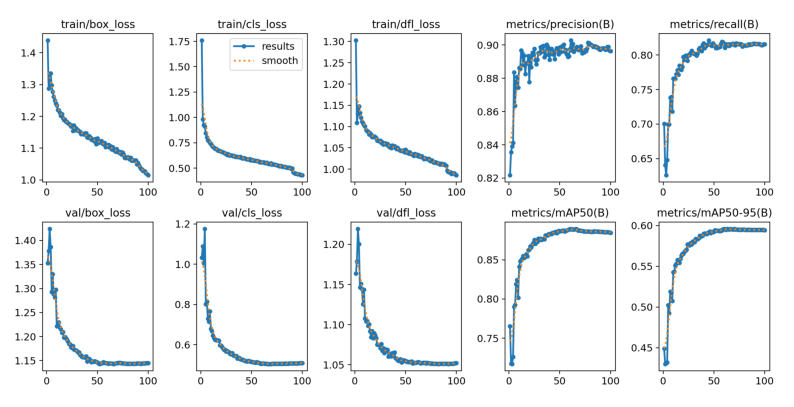

In [33]:
result_img = plt.imread('./runs/detect/train2/results.png')
plt.figure(figsize=(10, 10))
plt.imshow(result_img)
plt.axis('off')
plt.show()

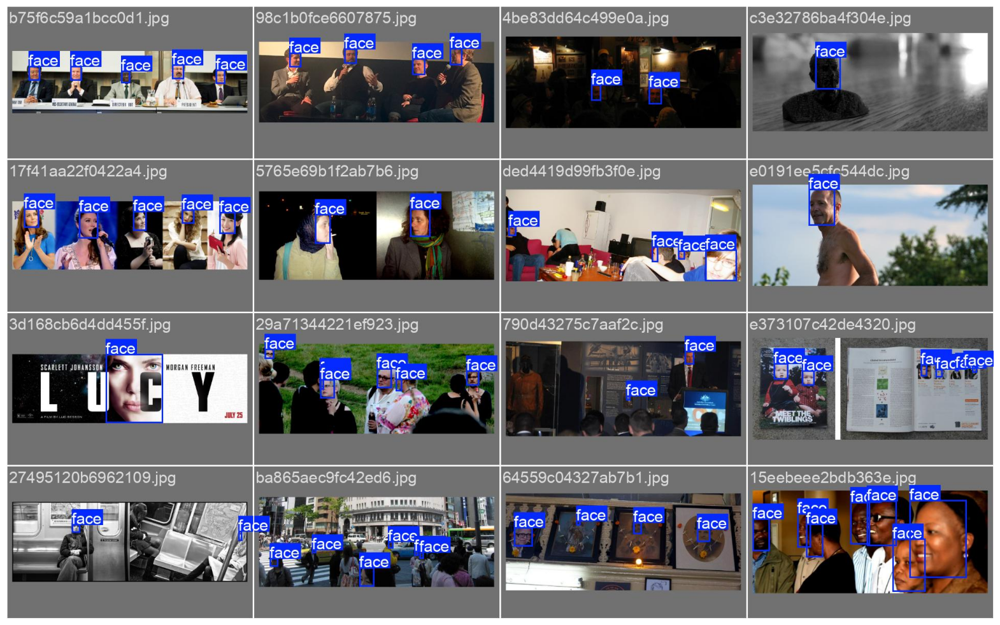

In [34]:
result_img = plt.imread('./runs/detect/train2/val_batch0_labels.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

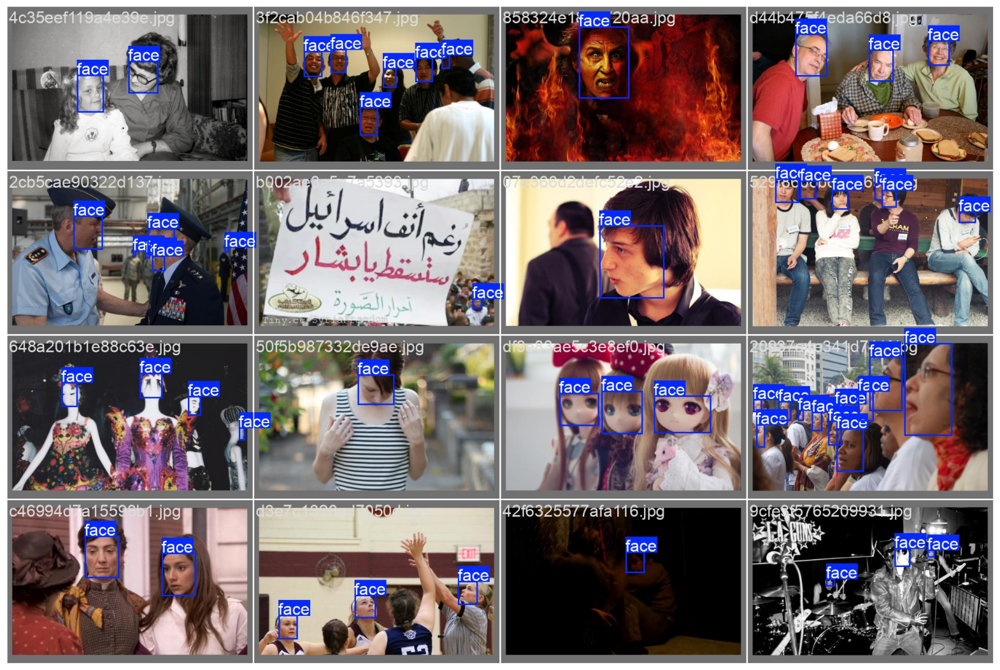

In [35]:
result_img = plt.imread('./runs/detect/train2/val_batch1_labels.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

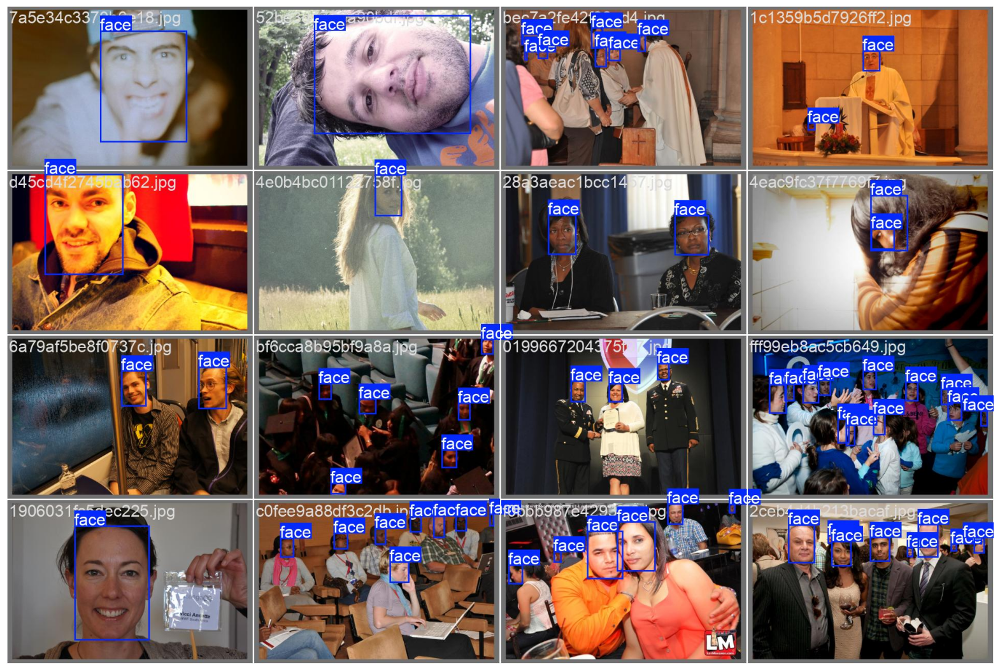

In [36]:
result_img = plt.imread('./runs/detect/train2/val_batch2_labels.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

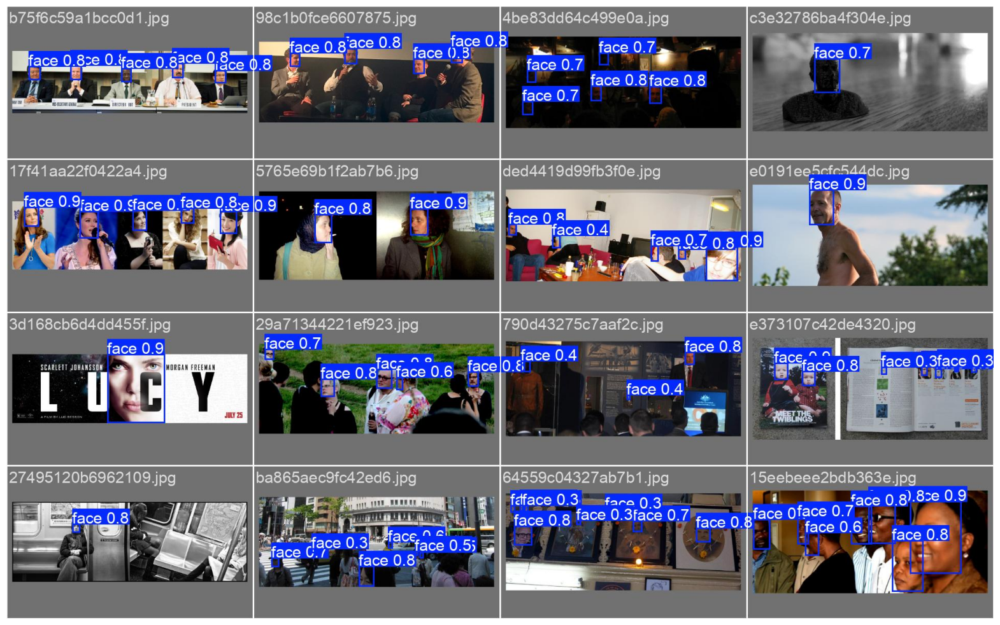

In [37]:
result_img = plt.imread('./runs/detect/train2/val_batch0_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

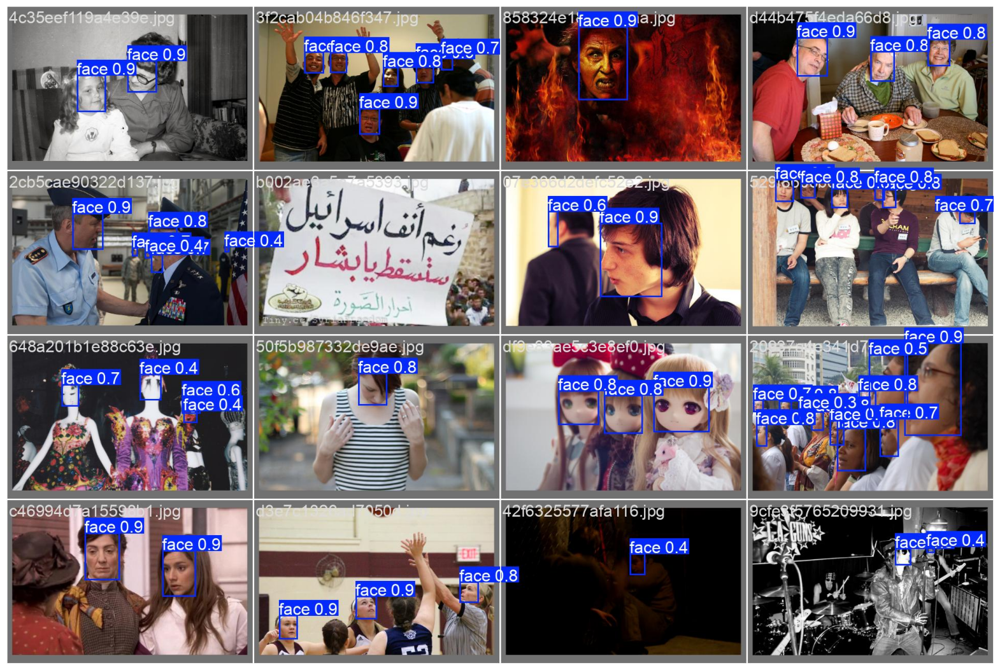

In [38]:
result_img = plt.imread('./runs/detect/train2/val_batch1_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

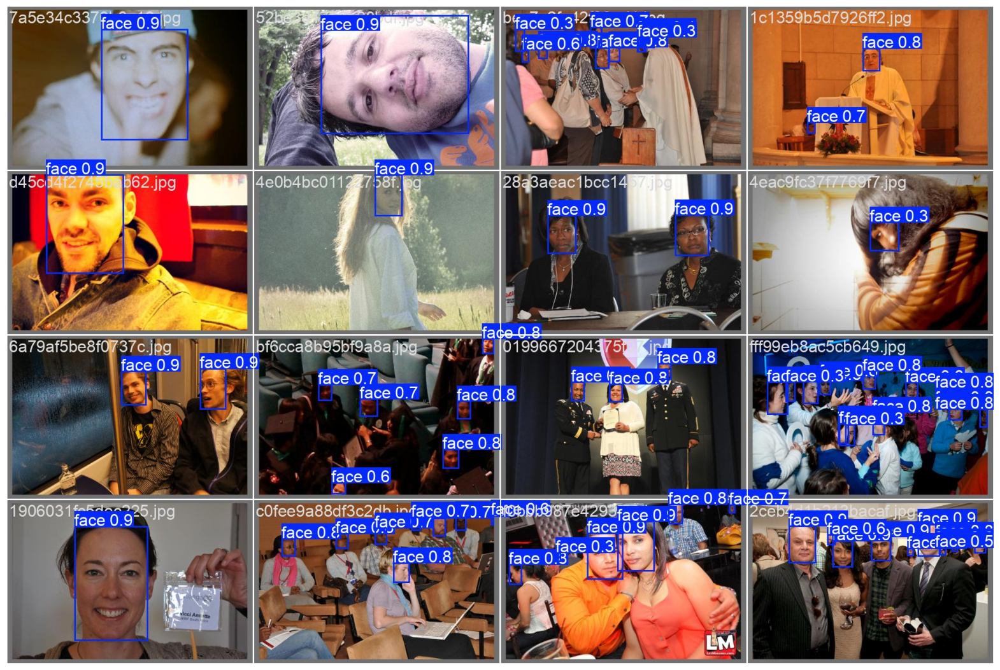

In [39]:
result_img = plt.imread('./runs/detect/train2/val_batch2_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()